<a href="https://colab.research.google.com/github/izzetbasli/ArtefactRemoval/blob/main/ICA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Kütüphaneler

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
!pip install mne

from google.colab import drive
drive.mount('/content/drive')

import numpy as np
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

     |████████████████████████████████| 7.4 MB 4.7 MB/s 
Mounted at /content/drive


# Verisetinin Görüntülemesi

(19, 5601)


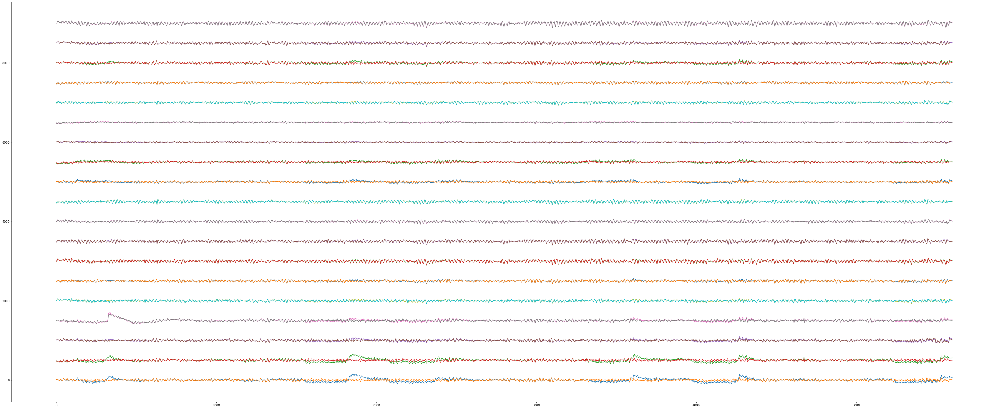

In [3]:
pure_all=loadmat('/content/drive/MyDrive/NeuroAnalyzer/Dataset/Semi-Sim/Pure_Data.mat')
noisy_all=loadmat('/content/drive/MyDrive/NeuroAnalyzer/Dataset/Semi-Sim/Contaminated_Data.mat')

pure1=pure_all.get('sim1_resampled')
noisy1 = noisy_all.get('sim1_con')
print(pure1.shape)
plt.figure(figsize=(60,25))
for i in range(19):
  plt.plot(noisy1[i,:]+i*500)
  plt.plot(pure1[i,:]+i*500)

# MNE ICA FIT

Creating RawArray with float64 data, n_channels=19, n_times=5601
    Range : 0 ... 5600 =      0.000 ...    21.875 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Filter length: 1691 samples (6.605 sec)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 3 components
Computing Extended Infomax ICA


<ipython-input-10-608fcfba1076>:14: DeprecationWarning: n_pca_components is deprecated and will be removed in 0.23, use it in apply() instead
  random_state=1)


Fitting ICA took 1.6s.
Applying ICA to Raw instance
    Transforming to ICA space (3 components)
    Zeroing out 1 ICA component
    Projecting back using 3 PCA components


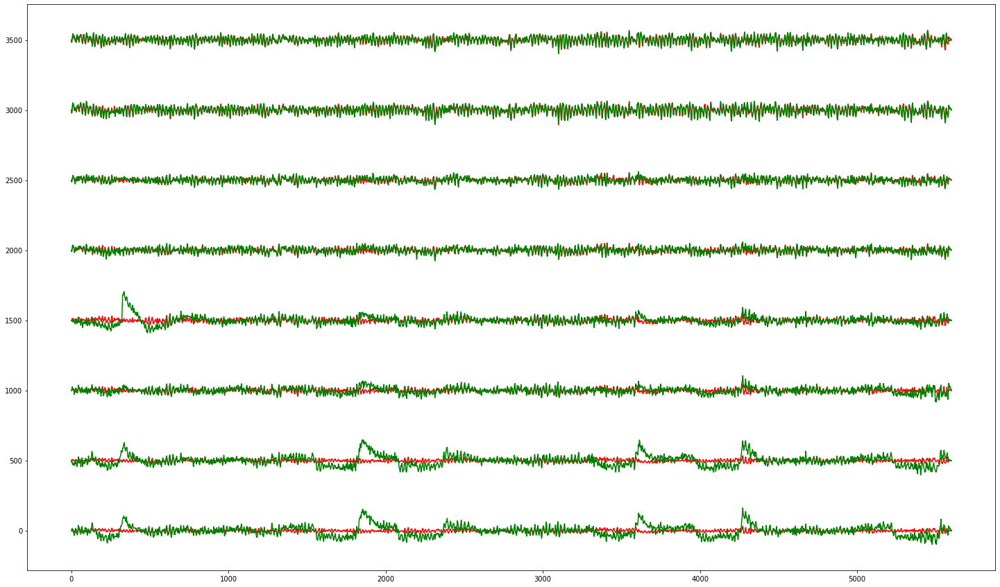

In [ ]:
import mne
noisy1 = noisy1[0:19]

ch_names=["EEG-"+str(n) for n in range(0,19)]
#ch_names = ["EEG"]*N_ch # , "EOG1", "EOG2", "EOG3"
info = mne.create_info(ch_names, 256, ch_types=["eeg"] * 19 ) #+ ["eog"] * 3
raw = mne.io.RawArray(noisy1, info)
raw.set_montage("standard_1020",on_missing ="ignore")

raw.filter(0.5, None)
raw_tmp = raw.copy()
ica = mne.preprocessing.ICA(method="infomax", n_pca_components=3, max_iter=300,
                            fit_params={"extended": True},
                            random_state=1)
ica.fit(raw)

#ica.plot_components(inst=raw_tmp, picks=range(16))
#ica.plot_sources(inst=raw_tmp)
ica.exclude = [0]

raw_corrected = raw.copy()
ica.apply(raw_corrected)

#raw.plot(n_channels=16, start=0, duration=2)
#raw_corrected.plot(n_channels=16, start=0, duration=2)

filtered=raw_tmp.get_data()
datas=raw_corrected.get_data()
plt.figure(figsize=(25,15))
for i in range(0,8):
  plt.plot(datas[i,:]+i*500,'r')
  plt.plot(noisy1[i,:]+i*500,'green')
  #plt.plot(pure1[i,:]+i*500,'b')
  #plt.plot(filtered[i]+i*2500,'black')

# MSE VE FFT

MSE ve FFT

Mean squared error:  98.94745008710098
(19, 5601)


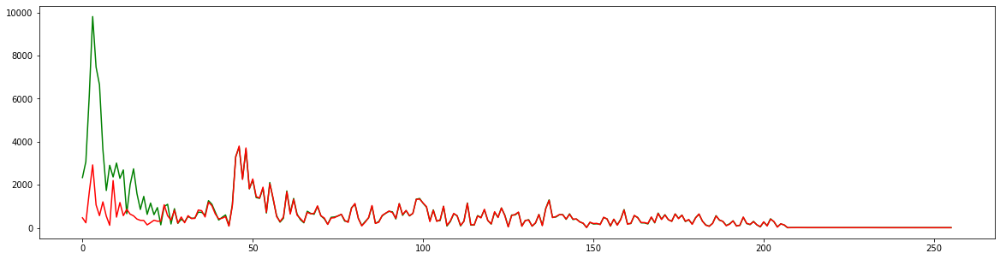

In [ ]:
mean_square_error=((pure1-datas)**2).mean()
print("Mean squared error: ",mean_square_error)
plt.show()
print(noisy1.shape)

import scipy as sci
noisy_fft=np.abs(sci.fft.fft(noisy1[0],1024))
clean_fft=np.abs(sci.fft.fft(pure1[0],1024))
cleaned_fft=np.abs(sci.fft.fft(datas[0],1024))

plt.figure(figsize=(20,5))

#plt.plot(noisy_fft[0:256],'g')
plt.plot(clean_fft[0:256],'r')
plt.plot(cleaned_fft[0:256],'b')
plt.show()

SKLEARN ICA

# SKLEARN ICA FIT

In [ ]:
import sklearn
from sklearn.decomposition import FastICA
ica = FastICA(n_components=19,  max_iter=1500)
components = ica.fit_transform(noisy1)
print(components.shape)
remove_indices = 0
components[:, remove_indices] = 0
X_restored = ica.inverse_transform(components)

(19, 19)


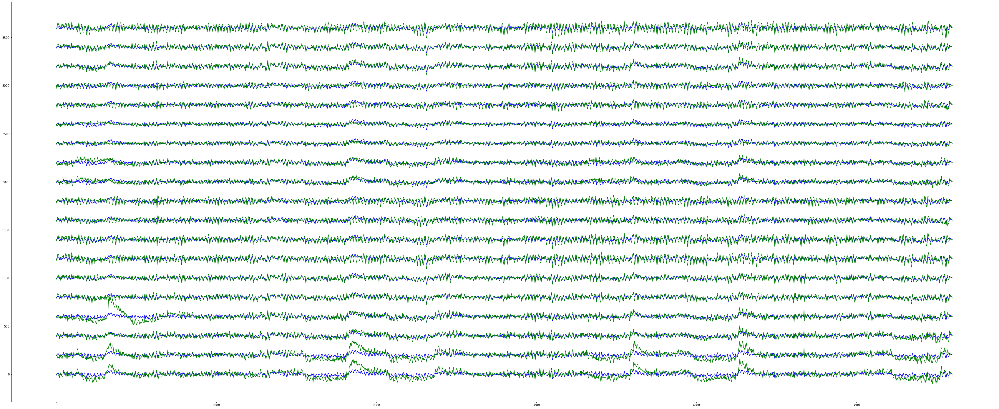

In [ ]:
plt.figure(figsize=(60,25))
for i in range(19):
  plt.plot(X_restored[i,:]+i*200,"b")
  plt.plot(noisy1[i,:]+i*200,"g")

# SKLEARN ICA MSE ve FFT

Mean squared error:  272.4412273198706


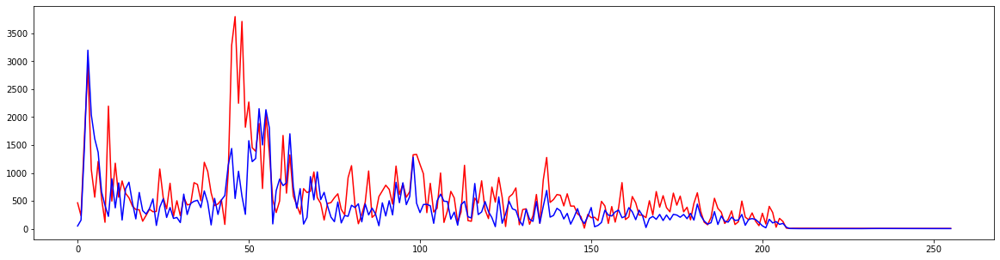

In [ ]:
mean_square_error=((pure1-X_restored)**2).mean()
print("Mean squared error: ",mean_square_error)

import scipy as sci
noisy_fft=np.abs(sci.fft.fft(noisy1[0],1024))
clean_fft=np.abs(sci.fft.fft(pure1[0],1024))
cleaned_fft=np.abs(sci.fft.fft(X_restored[0],1024))

plt.figure(figsize=(20,5))

#plt.plot(noisy_fft[0:512],'g')
plt.plot(clean_fft[0:256],'r')
plt.plot(cleaned_fft[0:256],'b')
plt.show()

# MNE VS SKLEARN





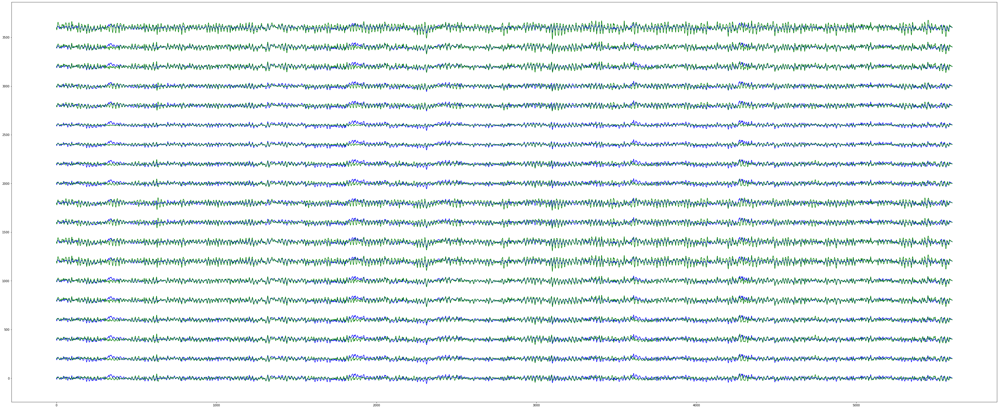

In [ ]:
plt.figure(figsize=(60,25))
for i in range(19):
  plt.plot(X_restored[i,:]+i*200,"b")
  plt.plot(datas[i,:]+i*200,"g")

Mean squared error:  249.8433419343147


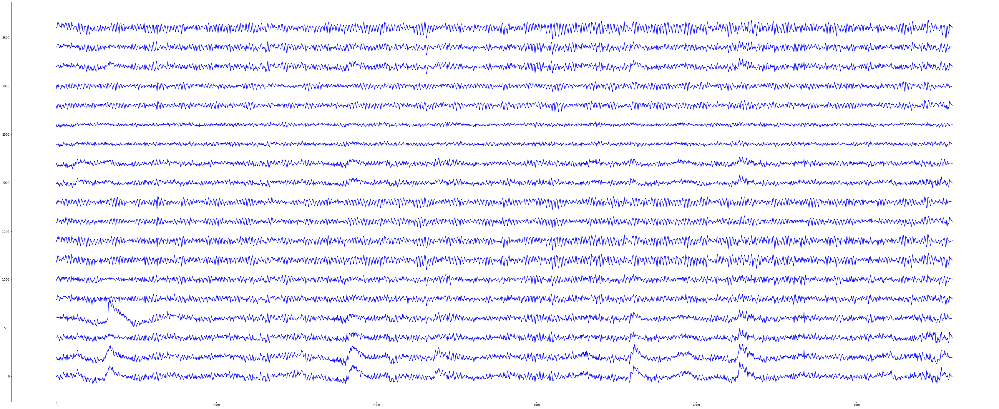

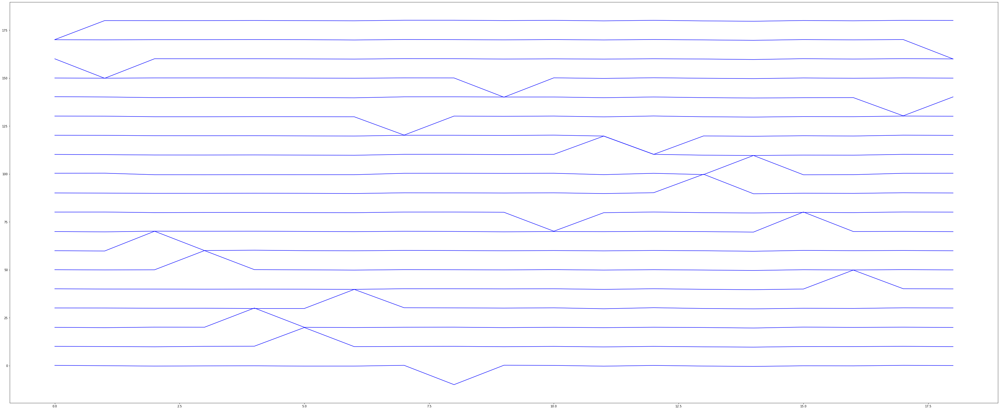

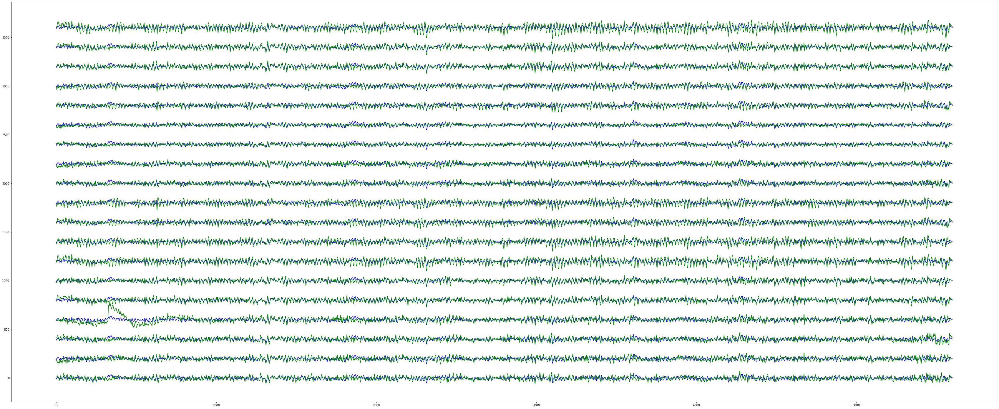

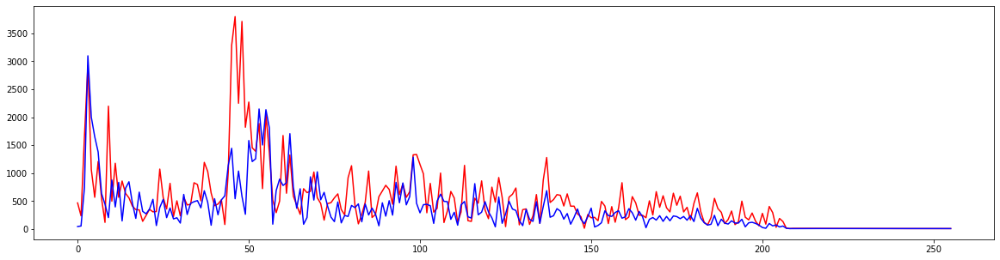

In [ ]:
from scipy.signal import kaiserord, lfilter, firwin, freqz,butter,filtfilt
def butter_bandpass(lowcut, highcut, fs, order, axis=-1):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5,axis=-1):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order, axis=axis)
    y = filtfilt(b, a, data, axis=axis)
    return y
plt.figure(figsize=(60,25))
filtrelenmis = butter_bandpass_filter(noisy1,0.5,50,250)
for i in range(19):
  plt.plot(filtrelenmis[i,:]+i*200,"b")
ica = FastICA(n_components=19,  max_iter=1500)
components = ica.fit_transform(filtrelenmis)
plt.figure(figsize=(60,25))
for i in range(19):
  plt.plot(components[i,:]*10+i*10,"b")
remove_indices = 0
components[:, remove_indices] = 0
X_restored = ica.inverse_transform(components)
plt.figure(figsize=(60,25))
for i in range(19):
  plt.plot(X_restored[i,:]+i*200,"b")
  plt.plot(pure1[i,:]+i*200,"g")
noisy_fft=np.abs(sci.fft.fft(noisy1[0],1024))
clean_fft=np.abs(sci.fft.fft(pure1[0],1024))
cleaned_fft=np.abs(sci.fft.fft(X_restored[0],1024))
mean_square_error=((pure1-X_restored)**2).mean()
print("Mean squared error: ",mean_square_error)
plt.figure(figsize=(20,5))

#plt.plot(noisy_fft[0:512],'g')
plt.plot(clean_fft[0:256],'r')
plt.plot(cleaned_fft[0:256],'b')
plt.show()